In [1]:
import numpy as np
from matplotlib import pyplot as plt
from astropy import units as u
from astropy import constants as c
from scipy.integrate import quad
from scipy.interpolate import CubicSpline
from scipy.optimize import curve_fit
from tqdm import tqdm

In [2]:
import ROOT as r
import warnings
warnings.filterwarnings('ignore')

In [3]:
r.gSystem.Load('$EVNDISPSYS/lib/libVAnaSum.so')

0

In [182]:
def get_distance(x1, y1, x2, y2):
    square = (x2-x1) ** 2 + (y2-y1) ** 2
    return np.sqrt(square)

In [6]:
def get_impact_factor(xi):

    rel_intensity_per_az = lambda phi, xi: np.sqrt(1 - xi**2 * np.sin(phi)**2)

    if xi > 1:
        bound = np.arcsin(1/xi)
    else:
        bound = np.pi/2
    
    integ = quad(rel_intensity_per_az, 0, bound, args=(xi))[0]
    return integ * 2 / np.pi

In [7]:
test_xis = np.linspace(0, 50, 10000)
test_factors = np.zeros_like(test_xis)

for i, xi in enumerate(test_xis):
    test_factors[i] = get_impact_factor(xi)

xi_from_factor = CubicSpline(test_factors[::-1], test_xis[::-1])
xi_from_xi_div_factor = CubicSpline(test_xis / test_factors, test_xis)

In [21]:
# 851000 has 100,000 muons per wobble
wobbles = ('0', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9', '1', '1.1', '1.2', '1.3', '1.4')

In [108]:
# valid_sim_muon_params_per_wobble = []

# for w in tqdm(wobbles):

#     filename = '/raid/reedbuck/lrizk/veritas/simulations/evndisp/muons/851000_w' + w + '.root'
#     sim = r.TFile(filename)
#     params = sim.Get('Tel_2/tpars')

#     num_events = 0
#     for event in params:
#         if event.muonValid and event.muonRadius:
#             num_events += 1

#     sim_muon_params = np.zeros((8, num_events))
#     i = 0

#     for event in params:
#         if event.muonValid and event.muonRadius:
#             sim_muon_params[0][i] = event.muonX0
#             sim_muon_params[1][i] = event.muonY0
#             sim_muon_params[2][i] = event.muonXC
#             sim_muon_params[3][i] = event.muonYC
#             sim_muon_params[4][i] = event.muonRadius
#             sim_muon_params[5][i] = event.muonRSigma
#             sim_muon_params[6][i] = event.muonSize
#             sim_muon_params[7][i] = event.muonIPCorrectedSize
#             i += 1

#     valid_sim_muon_params_per_wobble.append(sim_muon_params)

In [47]:
sim_muon_params_per_wobble = []

for w in tqdm(wobbles):

    filename = '/raid/reedbuck/lrizk/veritas/simulations/evndisp/muons/851000_w' + w + '.root'
    sim = r.TFile(filename)
    params = sim.Get('Tel_2/tpars')

    num_events = 0
    for event in params:
        if event.muonRadius:
            num_events += 1

    sim_muon_params = np.zeros((9, num_events))
    i = 0

    for event in params:
        if event.muonRadius:
            sim_muon_params[0][i] = event.muonX0
            sim_muon_params[1][i] = event.muonY0
            sim_muon_params[2][i] = event.muonXC
            sim_muon_params[3][i] = event.muonYC
            sim_muon_params[4][i] = event.muonRadius
            sim_muon_params[5][i] = event.muonRSigma
            sim_muon_params[6][i] = event.muonSize
            sim_muon_params[7][i] = event.muonIPCorrectedSize
            sim_muon_params[8][i] = event.muonValid
            i += 1

    sim_muon_params_per_wobble.append(sim_muon_params)

100%|██████████| 15/15 [02:20<00:00,  9.38s/it]


In [71]:
# for i, w in enumerate(wobbles):
#     output = 'sim_data/muons_851000_w' + w + '.csv'
#     np.savetxt(output, sim_muon_params_per_wobble[i].T, delimiter=',')

In [25]:
# sims = 'sim_data/muons_851000_w0.csv'
# muon_x, muon_y, muon_xc, muon_yc, muon_radii, muon_radii_err, muon_sizes, muon_corr_sizes = np.loadtxt(sims, delimiter=',', unpack=True)

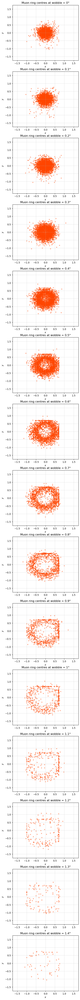

In [107]:
plt.figure(figsize=(5, 75))

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    positions = sim_muon_params_per_wobble[i][:2]

    plt.subplot(15, 1, i+1)

    plt.scatter(positions[0][validity], positions[1][validity], c='orangered', marker='o', s=10, alpha=0.4)

    plt.xlim(-1.75, 1.75)
    plt.ylim(-1.75, 1.75)

    plt.grid(alpha=0.4)
    plt.xlabel(r'$x$')
    plt.ylabel(r'$y$')
    plt.title('Muon ring centres at wobble = ' + w + '°')

plt.show()

In [119]:
sim_muons_w0_params = sim_muon_params_per_wobble[0]

In [120]:
distances = get_distance(*sim_muons_w0_params[:4])
radii = sim_muons_w0_params[4]
radii_err = sim_muons_w0_params[5]
corr_sizes = sim_muons_w0_params[7]
evndisp_factors = sim_muons_w0_params[6] / corr_sizes
evndisp_xis = xi_from_factor(evndisp_factors)
validity = np.array([bool(v) for v in sim_muons_w0_params[8]])

In [84]:
recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
recalc_factors = np.zeros_like(recalc_xis)

for i, xi in enumerate(recalc_xis):
    recalc_factors[i] = get_impact_factor(xi)

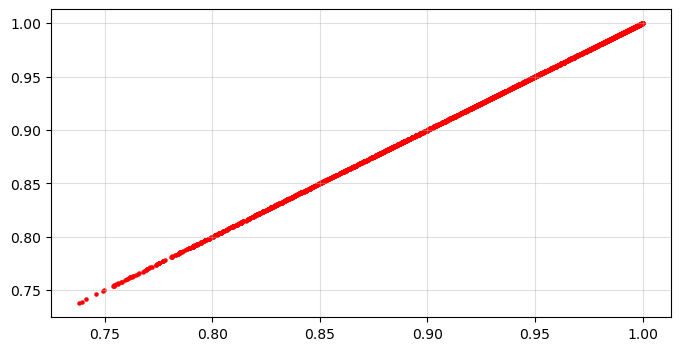

In [68]:
plt.figure(figsize=(8, 4))

plt.scatter(evndisp_factors, recalc_factors, c='red', marker='o', s=5)

plt.grid(alpha=0.4)
plt.show()

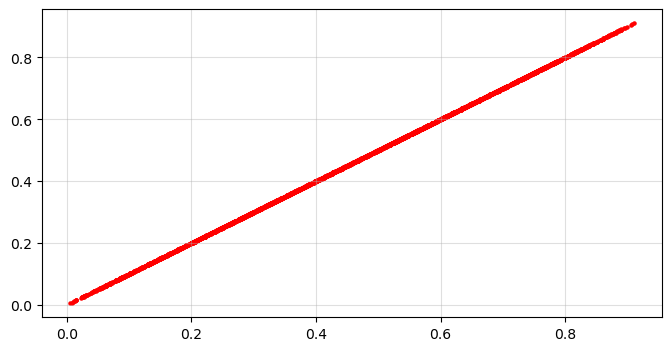

In [69]:
plt.figure(figsize=(8, 4))

plt.scatter(evndisp_xis, recalc_xis, c='red', marker='o', s=5)

plt.grid(alpha=0.4)
plt.show()

In [94]:
np.max(evndisp_xis), np.max(recalc_xis)

(nan, 2.4644136354311805)

In [81]:
np.max(evndisp_xis), np.max(recalc_xis)

(0.9100000277263294, 0.9104386296834939)

In [77]:
for params in sim_muon_params_per_wobble:
    print(np.mean(params[6]))

252.6753875968992
253.22380370971248
253.85069421155006
247.31515253100906
229.31423859076378
184.90710972057394
135.13291163726402
95.99228222592413
67.81070579630645
47.13120908978634
29.113060271988413
17.899795559906707
10.501837610797121
6.903211948978917
3.7540908611042685


In [118]:
print("num_valid, num_total")
for params in sim_muon_params_per_wobble:
    validity = np.array([bool(v) for v in params[8]])
    print(len(params[1][validity]), len(params[1]))

num_valid, num_total
4039 59856
4043 59789
4028 59636
3978 59660
3700 58812
3027 55614
2243 51696
1578 47423
1133 43752
789 40485
489 37281
302 34729
180 32379
115 30262
56 28417


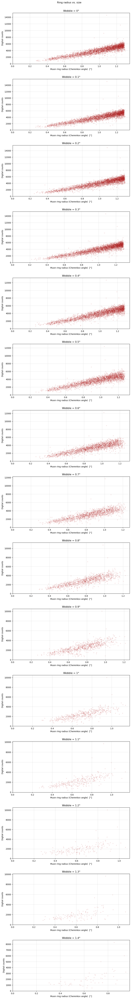

In [133]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]
    
    plt.subplot(15, 1, i+1)
    plt.scatter(radii, corr_sizes, c='firebrick', marker='o', s=10, alpha=0.1)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.ylim(ymin=0)

plt.suptitle('Ring radius vs. size')
plt.show()

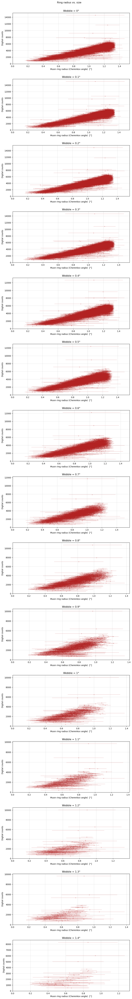

In [134]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=radii, xerr=radii_err, y=corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.ylim(ymin=0)

plt.suptitle('Ring radius vs. size')
plt.show()

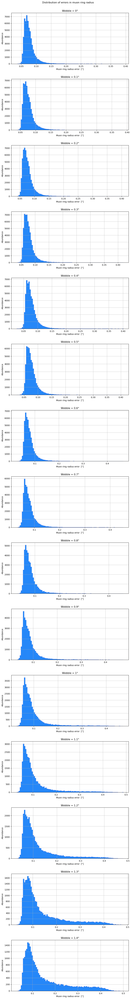

In [136]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    #validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii_err = sim_muon_params_per_wobble[i][5]#[validity]
    
    plt.subplot(15, 1, i+1)
    hist_data = plt.hist(radii_err, bins=100, edgecolor='royalblue', color='dodgerblue')

    plt.grid(alpha=0.8)
    plt.xlabel('Muon ring radius error  [°]')
    plt.ylabel('Abundance')
    plt.title('Wobble = ' + w + '°')
    
plt.suptitle('Distribution of errors in muon ring radius')
plt.show()

In [143]:
err_cutoff = 0.1

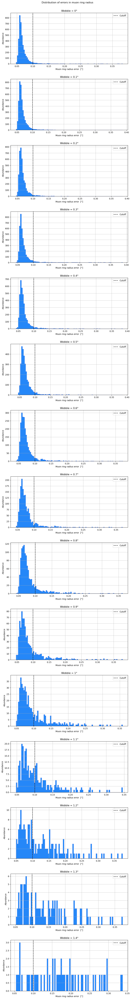

In [144]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    
    plt.subplot(15, 1, i+1)
    hist_data = plt.hist(radii_err, bins=100, edgecolor='royalblue', color='dodgerblue')
    plt.axvline(x=err_cutoff, c='black', ls='--', label='Cutoff')

    plt.grid(alpha=0.8)
    plt.xlabel('Muon ring radius error  [°]')
    plt.ylabel('Abundance')
    plt.title('Wobble = ' + w + '°')
    plt.legend()
    
plt.suptitle('Distribution of errors in muon ring radius')
plt.show()

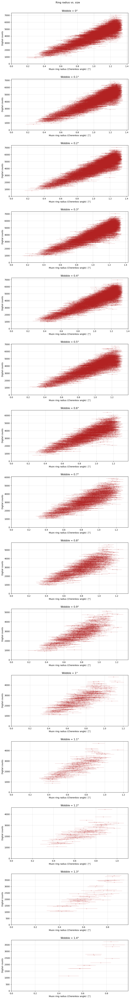

In [145]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    good_radii = radii[radii_err < err_cutoff]
    good_radii_err = radii_err[radii_err < err_cutoff]
    good_corr_sizes = corr_sizes[radii_err < err_cutoff]
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=good_radii, xerr=good_radii_err, y=good_corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2)

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.ylim(ymin=0)

plt.suptitle('Ring radius vs. size')
plt.show()

In [146]:
def linear_0(y, a):

    a_prime = 1/a
    
    return a_prime * y

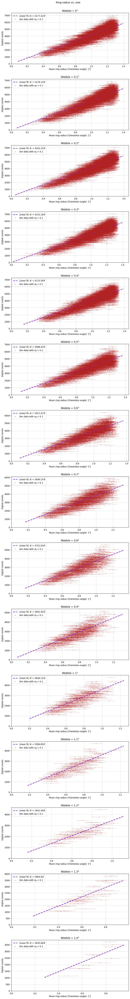

In [149]:
plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    good_radii = radii[radii_err < err_cutoff]
    good_radii_err = radii_err[radii_err < err_cutoff]
    good_corr_sizes = corr_sizes[radii_err < err_cutoff]

    fit_0 = curve_fit(
    linear_0,
    xdata=good_corr_sizes, 
    ydata=good_radii,
    sigma=good_radii_err, 
    absolute_sigma=True, 
    p0=[5000],
    )

    slope_0 = fit_0[0][0]
    angles_range = np.linspace(np.min(good_radii) - 0.2, np.max(good_radii) + 0.1, 1000)
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=good_radii, xerr=good_radii_err, y=good_corr_sizes, c='firebrick', marker='o', ms=3, ls='', alpha=0.2,
                 label=r'Sim data with $\sigma_\theta$ < {}'.format(round(err_cutoff, 2)))
    plt.plot(angles_range, slope_0 * angles_range, c='blueviolet', lw=2.5, ls='--',
             label=r'Linear fit: $N \, = \, {} \, \theta$'.format(round(slope_0, 2)))

    plt.grid(alpha=0.4)
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Digital counts')
    plt.legend()
    plt.title('Wobble = ' + w + '°')

    plt.xlim(xmin=0)
    plt.ylim(ymin=0)

plt.suptitle('Ring radius vs. size')
plt.show()

In [151]:
# Chi2 test

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]
    corr_sizes = sim_muon_params_per_wobble[i][7][validity]

    good_radii = radii[radii_err < err_cutoff]
    good_radii_err = radii_err[radii_err < err_cutoff]
    good_corr_sizes = corr_sizes[radii_err < err_cutoff]

    fit_0 = curve_fit(
    linear_0,
    xdata=good_corr_sizes, 
    ydata=good_radii,
    sigma=good_radii_err, 
    absolute_sigma=True, 
    p0=[5000],
    )

    slope_0 = fit_0[0][0]
    model_guesses_0 = linear_0(good_corr_sizes, slope_0)

    chi2 = np.sum((model_guesses_0 - good_radii)**2 / (good_radii_err)**2)
    dof = len(model_guesses_0) - 1
    red_chi2 = chi2/dof
    print('Wobble = {}°'.format(w) + ': reduced chi^2', red_chi2)

Wobble = 0°: reduced chi^2 3.9958087791507193
Wobble = 0.1°: reduced chi^2 4.121401915133259
Wobble = 0.2°: reduced chi^2 4.0789111353926
Wobble = 0.3°: reduced chi^2 4.172273486098874
Wobble = 0.4°: reduced chi^2 4.329071413239475
Wobble = 0.5°: reduced chi^2 4.59147769542541
Wobble = 0.6°: reduced chi^2 4.493127617379323
Wobble = 0.7°: reduced chi^2 3.7506933371288214
Wobble = 0.8°: reduced chi^2 3.8944297928419607
Wobble = 0.9°: reduced chi^2 3.2266062376852784
Wobble = 1°: reduced chi^2 2.7427435712125408
Wobble = 1.1°: reduced chi^2 2.4122786003739147
Wobble = 1.2°: reduced chi^2 2.4937928073539677
Wobble = 1.3°: reduced chi^2 2.600688025333041
Wobble = 1.4°: reduced chi^2 3.399086937827468


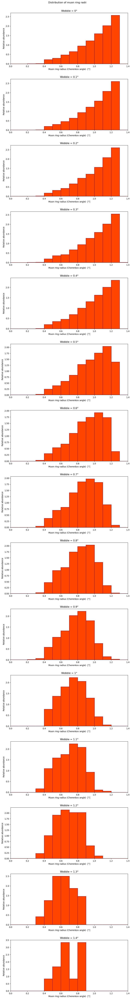

In [153]:
histobins = np.arange(0, 1.5, 0.1)

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]

    good_radii = radii[radii_err < err_cutoff]

    plt.subplot(15, 1, i+1)
    plt.hist(good_radii, bins=histobins, density=True, edgecolor='firebrick', lw=2, color='orangered')
    plt.xlim(histobins[0], histobins[-1])
    
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel('Relative abundance')
    plt.title('Wobble = ' + w + '°')

plt.suptitle('Distribution of muon ring radii')
plt.show()

In [155]:
muon_mass = (105.65837 * u.MeV/c.c**2).to(u.kg).value  # kg
veritas_alt = 1268  # m
optimal_wvl = 380*1e-9

def n_air(lam, alt=veritas_alt):

    # Empirically determined constants
    A = 2.73e-4 
    B = 1.23e-18  # m^2
    C = 3.56e-32  # m^4
    
    # Scale height of the atmosphere
    h_0 = 8.4e3  # m

    epsilon_0 = A + B/lam**2 + C/lam**4
    epsilon = epsilon_0 * np.exp(-alt / h_0)
    
    return 1 + epsilon

def get_beta(E, m=c.m_e.value):

    return np.sqrt(1 - m**2 * c.c.value**4 / E**2)

def get_cherenkov_angle(beta, n):

    return np.arccos(1 / (beta * n))

def dNdtheta(theta, N_tot, E_min, E_max, index, n, m):

    a = N_tot * (index+1) / (E_max**(index+1) - E_min**(index+1))

    A = a * (m * c.c.value**2) ** (index+1)
    B = (1 - n**-2 * np.cos(theta)**-2) ** (-0.5*index - 1.5)
    C = np.tan(theta) * n**-2 * np.cos(theta)**-2

    return A * B * C

E_min = 5.3 * u.GeV.to(u.J)  # J
E_max = 1e4 * u.GeV.to(u.J)  # J
index = -2.7

reference_n = n_air(optimal_wvl)
asymptotic_theta = get_cherenkov_angle(beta=1, n=reference_n)
sample_thetas = np.linspace(
    get_cherenkov_angle(beta=get_beta(E_min, m=muon_mass), n=reference_n),
    get_cherenkov_angle(beta=get_beta(E_max, m=muon_mass), n=reference_n),
    10000
)

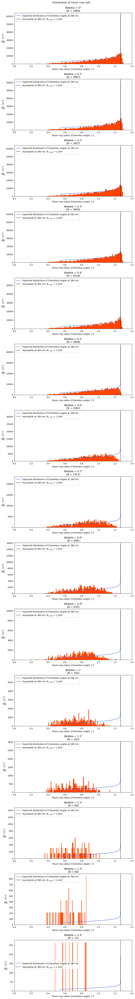

In [171]:
histobins = np.arange(0, 1.5, 0.1)

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    radii = sim_muon_params_per_wobble[i][4][validity]
    radii_err = sim_muon_params_per_wobble[i][5][validity]

    good_radii = radii[radii_err < err_cutoff]
    N_tot = len(good_radii)

    histo_values, bin_edges = np.histogram(good_radii, bins=100, density=True)

    plt.subplot(15, 1, i+1)
    plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered')  # Area of all bins = N_tot
    
    plt.plot(sample_thetas / np.pi * 180, 
             dNdtheta(sample_thetas, N_tot, E_min, E_max, index, n=reference_n, m=muon_mass) 
             * np.pi / 180,
             c='royalblue', lw=1.5,
             label='Expected distribution of Cherenkov angles at {} nm'.format(int(optimal_wvl * 1e9)))
    
    plt.axvline(asymptotic_theta / np.pi * 180, 
                label='Asymptote at {} nm: '.format(int(optimal_wvl * 1e9))
                + r'$\theta_{C, \mathrm{max}}$ = ' 
                + str(round(asymptotic_theta / np.pi * 180, 3)) + '°',
                c='black', lw=1.5, ls='--')
    
    plt.xlabel('Muon ring radius (Cherenkov angle)  [°]')
    plt.ylabel(r'$\frac{dN}{d\theta_C}$  [1/°]')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(histobins[0], histobins[-1])
    plt.legend()

plt.suptitle('Distribution of muon ring radii')
plt.show()

In [169]:
def dNdxi(xi, N_tot, xi_max):
    return N_tot / xi_max**2 * (2 * xi)

xi_max = 3

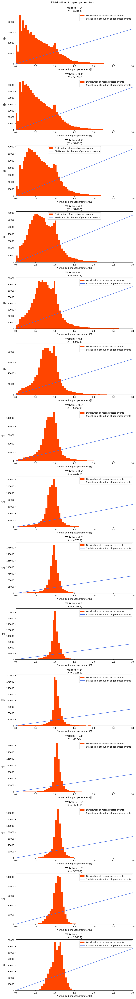

In [183]:
sample_xis = np.arange(0, 3.1, 0.1) 

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])
    radii = sim_muon_params_per_wobble[i][4]
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=60, density=True)

    plt.subplot(15, 1, i+1)
    plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered', 
               label='Distribution of reconstructed events')  # Area of all bins = N_tot
    
    plt.plot(sample_xis, dNdxi(sample_xis, 1e5, xi_max), c='royalblue', lw=1.5,
             label='Statistical distribution of generated events')
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$\frac{dN}{d\xi}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(sample_xis[0], sample_xis[-1])
    plt.legend()

plt.suptitle('Distribution of impact parameters')
plt.show()

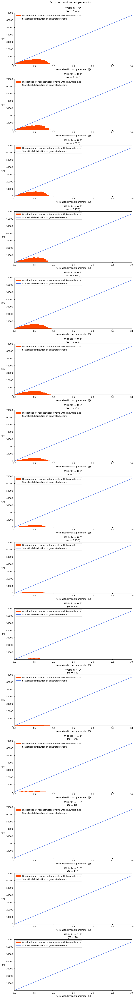

In [176]:
sample_xis = np.arange(0, 3.1, 0.1) 

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])
    radii = sim_muon_params_per_wobble[i][4]
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)[validity]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=20, density=True)

    plt.subplot(15, 1, i+1)
    plt.stairs(histo_values * N_tot, bin_edges, fill=True, color='orangered', 
               label='Distribution of reconstructed events with knowable size')  # Area of all bins = N_tot
    
    plt.plot(sample_xis, dNdxi(sample_xis, 1e5, xi_max), c='royalblue', lw=1.5,
             label='Statistical distribution of generated events')
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$\frac{dN}{d\xi}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(sample_xis[0], sample_xis[-1])
    plt.legend()

plt.suptitle('Distribution of impact parameters')
plt.show()

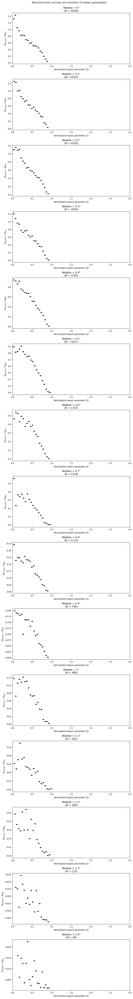

In [201]:
sample_xis = np.arange(0, 3.1, 0.1) 

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])
    radii = sim_muon_params_per_wobble[i][4]
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)[validity]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=20, density=True)
    bin_interval = bin_edges[1] - bin_edges[0]
    mid_bins = bin_edges[:-1] + bin_interval/2

    ratios = np.zeros_like(mid_bins)
    for j, xi in enumerate(mid_bins):
        dN_r = histo_values[j] * N_tot * bin_interval
        dN_g = dNdxi(xi, 1e5, xi_max) * bin_interval
        ratios[j] = dN_r / dN_g
    
    plt.subplot(15, 1, i+1)
    plt.errorbar(x=mid_bins, xerr=bin_interval/2, y=ratios, c='black', marker='o', ms=4, ls='')
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$N_\mathrm{reconst} \div N_\mathrm{gen}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(sample_xis[0], sample_xis[-1])
    plt.legend()

plt.suptitle('Reconstruction success as a function of impact parameters')
plt.show()

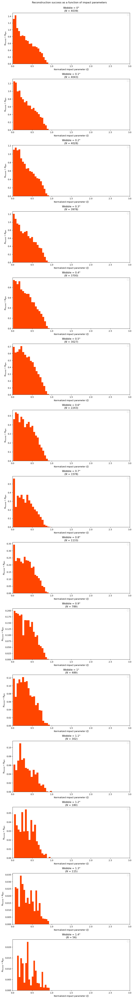

In [202]:
sample_xis = np.arange(0, 3.1, 0.1) 

plt.figure(figsize=(10, 75))
plt.subplots_adjust(top=0.97, hspace=0.3)

for i, w in enumerate(wobbles):
    distances = get_distance(*sim_muon_params_per_wobble[i][:4])
    radii = sim_muon_params_per_wobble[i][4]
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    
    recalc_xis = xi_from_xi_div_factor(2 * distances / radii)[validity]
    # recalc_factors = np.zeros_like(recalc_xis)
    # for i, xi in enumerate(recalc_xis):
    #     recalc_factors[i] = get_impact_factor(xi)

    N_tot = len(recalc_xis)

    histo_values, bin_edges = np.histogram(recalc_xis, bins=20, density=True)
    bin_interval = bin_edges[1] - bin_edges[0]
    mid_bins = bin_edges[:-1] + bin_interval/2

    ratios = np.zeros_like(mid_bins)
    for j, xi in enumerate(mid_bins):
        dN_r = histo_values[j] * N_tot * bin_interval
        dN_g = dNdxi(xi, 1e5, xi_max) * bin_interval
        ratios[j] = dN_r / dN_g
    
    plt.subplot(15, 1, i+1)
    plt.stairs(ratios, bin_edges, fill=True, color='orangered')
    
    plt.xlabel(r'Normalized impact parameter ($\xi$)')
    plt.ylabel(r'$N_\mathrm{reconst} \div N_\mathrm{gen}$')
    plt.title('Wobble = ' + w + '°\n' + r'($N$ = {})'.format(int(N_tot)))
    
    plt.xlim(sample_xis[0], sample_xis[-1])
    plt.legend()

plt.suptitle('Reconstruction success as a function of impact parameters')
plt.show()

In [161]:
wobbles_float = np.array([float(w) for w in wobbles])
num_reconstruct = np.zeros_like(wobbles_float)
num_reconstruct_valid = np.zeros_like(wobbles_float)  # knowable size

for i, w in enumerate(wobbles):
    validity = np.array([bool(v) for v in sim_muon_params_per_wobble[i][8]])
    num_reconstruct[i] = len(validity)
    num_reconstruct_valid[i] = len(validity[validity])

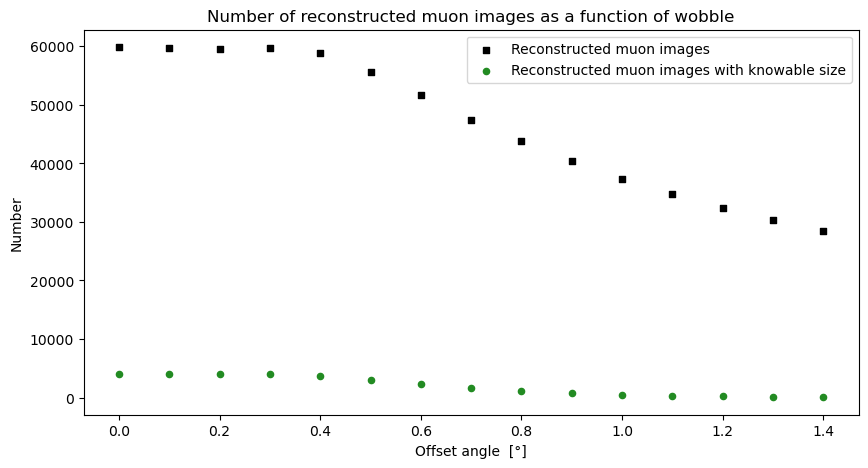

In [167]:
plt.figure(figsize=(10, 5))

plt.scatter(wobbles_float, num_reconstruct, c='black', marker='s', s=20, label='Reconstructed muon images')
plt.scatter(wobbles_float, num_reconstruct_valid, c='forestgreen', marker='o', s=20, label='Reconstructed muon images with knowable size')
    
plt.xlabel('Offset angle  [°]')
plt.ylabel('Number')
plt.title('Number of reconstructed muon images as a function of wobble')

plt.legend()
plt.show()

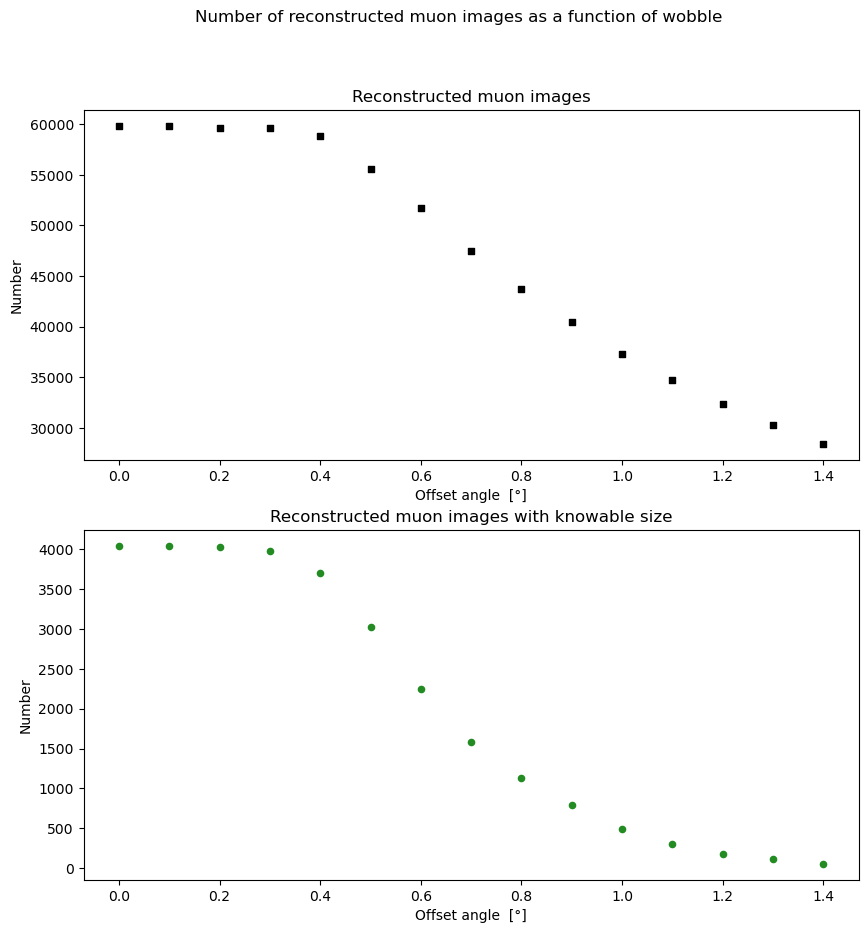

In [168]:
plt.figure(figsize=(10, 10))

plt.subplot(2, 1, 1)
plt.scatter(wobbles_float, num_reconstruct, c='black', marker='s', s=20)
    
plt.xlabel('Offset angle  [°]')
plt.ylabel('Number')
plt.title('Reconstructed muon images')

plt.subplot(2, 1, 2)
plt.scatter(wobbles_float, num_reconstruct_valid, c='forestgreen', marker='o', s=20)
    
plt.xlabel('Offset angle  [°]')
plt.ylabel('Number')
plt.title('Reconstructed muon images with knowable size')

plt.suptitle('Number of reconstructed muon images as a function of wobble')
plt.show()